# Tutorial: Spectral GNNs




## Introduction
Spectral GNNs leverage the spectral theory of graphs to process graph-structured data. This tutorial will explore how to apply Spectral GNNs.

## <img width="50" height="50" src="https://img.icons8.com/bubbles/50/wrench.png" alt="wrench" style="display:inline"/> Environment Setup

In [19]:
!pip install torch torchvision
!pip install networkx matplotlib scikit-learn
!pip install plotly
!pip install torch_geometric
!pip install -U kaleido

# Optional dependencies:
!pip install pyg_lib torch_scatter torch_sparse torch_cluster torch_spline_conv -f https://data.pyg.org/whl/torch-2.1.0+cu121.html

# Install required packages.
import plotly.io as pio
import os
import torch
os.environ['TORCH'] = torch.__version__
print(torch.__version__)


# Helper function for visualization.
%matplotlib inline
import matplotlib.pyplot as plt
from IPython.display import Image, display
from sklearn.manifold import TSNE
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from sklearn.neighbors import kneighbors_graph
import networkx as nx
import plotly.graph_objs as go
import plotly.io as pio


def visualize(h, color):
    z = TSNE(n_components=2).fit_transform(h.detach().cpu().numpy())

    plt.figure(figsize=(10,10))
    plt.xticks([])
    plt.yticks([])

    plt.scatter(z[:, 0], z[:, 1], s=70, c=color, cmap="Set2")
    plt.show()

Looking in links: https://data.pyg.org/whl/torch-2.1.0+cu121.html
2.1.0+cu121


In [20]:
from torch_geometric.datasets import Planetoid
from torch_geometric.transforms import NormalizeFeatures

dataset = Planetoid(root='data/Planetoid', name='Cora', transform=NormalizeFeatures())

print()
print(f'Dataset: {dataset}:')
print('======================')
print(f'Number of graphs: {len(dataset)}')
print(f'Number of features: {dataset.num_features}')
print(f'Number of classes: {dataset.num_classes}')

data = dataset[0]  # Get the first graph object.

print()
print(data)
print('===========================================================================================================')

# Gather some statistics about the graph.
print(f'Number of nodes: {data.num_nodes}')
print(f'Number of edges: {data.num_edges}')
print(f'Average node degree: {data.num_edges / data.num_nodes:.2f}')
print(f'Number of training nodes: {data.train_mask.sum()}')
print(f'Training node label rate: {int(data.train_mask.sum()) / data.num_nodes:.2f}')
print(f'Has isolated nodes: {data.has_isolated_nodes()}')
print(f'Has self-loops: {data.has_self_loops()}')
print(f'Is undirected: {data.is_undirected()}')


Dataset: Cora():
Number of graphs: 1
Number of features: 1433
Number of classes: 7

Data(x=[2708, 1433], edge_index=[2, 10556], y=[2708], train_mask=[2708], val_mask=[2708], test_mask=[2708])
Number of nodes: 2708
Number of edges: 10556
Average node degree: 3.90
Number of training nodes: 140
Training node label rate: 0.05
Has isolated nodes: False
Has self-loops: False
Is undirected: True


In [21]:
def plot_interactive(domain, signal, title):
    presicion = 4 # how many decimal places to include in the color vector signal
    rounded_signal = np.round(signal, presicion)
    trace = go.Scatter3d(
        x=domain[:, 0], y=domain[:, 1], z=domain[:, 2],
        mode='markers',
        marker=dict(
            size=3,
            color=rounded_signal,  # Color by signal values
            colorscale='Inferno',  # Color scale
            opacity=0.8,
            colorbar=dict(title='Value')  # Add a color bar

        )
    )

    layout = go.Layout(
        title=dict(text=title, y=0.9, x=0.5, xanchor='center', yanchor='top'),
        margin=dict(l=0, r=0, b=0, t=40),  # Adjust top margin to fit title
        scene=dict(
            xaxis=dict(title='X-axis'),
            yaxis=dict(title='Y-axis'),
            zaxis=dict(title='Z-axis')
        ),
        width=800,  # Adjust width
        height=400  # Adjust height
    )

    fig = go.Figure(data=[trace], layout=layout)
    static_image = pio.to_image(fig, format='png', width=800, height=400, scale=2)
    display(Image(static_image))


In [22]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [23]:
def plot3d_graph_plotly(points, G,title='3D Visualization'):
    edge_x = []
    edge_y = []
    edge_z = []
    for edge in G.edges():
        x0, y0, z0 = points[edge[0]]
        x1, y1, z1 = points[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])
        edge_z.extend([z0, z1, None])

    edge_trace = go.Scatter3d(
        x=edge_x, y=edge_y, z=edge_z,
        line=dict(width=2, color='blue'),
        mode='lines')

    node_trace = go.Scatter3d(
        x=points[:, 0], y=points[:, 1], z=points[:, 2],
        mode='markers',
        marker=dict(size=5, color='red', opacity=0.8)
    )

    fig = go.Figure(data=[edge_trace, node_trace])
    fig.update_layout(scene=dict(
                        xaxis_title='X',
                        yaxis_title='Y',
                        zaxis_title='Z'),
                        width=800,  # Adjust width
                        height=400,  # Adjust height
                      title=title)
    static_image = pio.to_image(fig, format='png', width=800, height=400, scale=2)
    display(Image(static_image))

## Part 1: Graph Fourier Transform (example on manifolds)


##<img width="48" height="48" src="https://img.icons8.com/color/48/object.png" alt="object" style="display:inline"/> Build Manifold - Torus


In [24]:
def create_torus(r=0.7,R=2, n_samples=5000):
    theta = np.random.uniform(low=0, high = 2*np.pi,size = n_samples)
    phi =  np.random.uniform(low=0, high = 2*np.pi,size = n_samples)

    x = (R + r*np.cos(phi))*np.cos(theta)
    y = (R + r*np.cos(phi))*np.sin(theta)
    z = r*np.sin(phi)

    return np.column_stack((x,y,z))

points = create_torus()

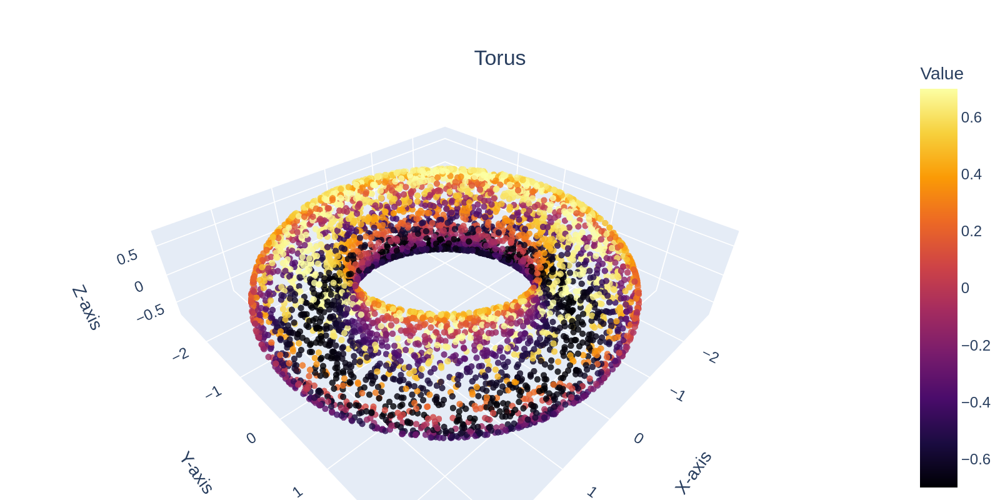

In [25]:
plot_interactive(points,points[:,2],"Torus")

## <img width="48" height="48" src="https://img.icons8.com/color-glass/48/decentralized-network.png" alt="decentralized-network" style="display:inline"/> Build K-NN Graph

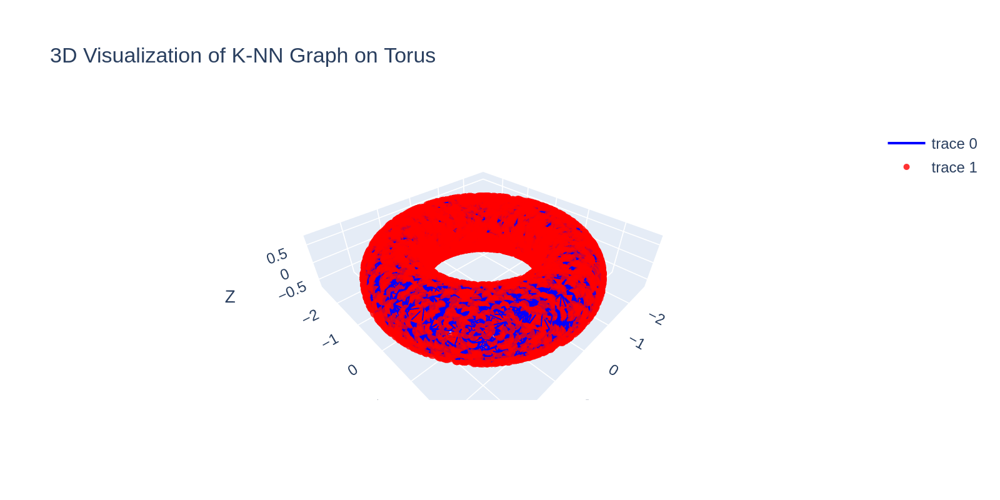

In [26]:
# Create a k-nearest neighbors graph from the points
A = kneighbors_graph(points, n_neighbors=20, mode='distance', include_self=True)
G = nx.from_scipy_sparse_array(A)
plot3d_graph_plotly(points, G,title = '3D Visualization of K-NN Graph on Torus')

### <img width="48" height="48" src="https://img.icons8.com/stickers/100/matrix-desktop.png" style="display:inline" alt="matrix-desktop"/> Calculate Graph Laplacian $L$

In [27]:
laplacian = nx.laplacian_matrix(G).toarray()
print(laplacian.shape)
eigenvalues, eigenvectors = np.linalg.eigh(laplacian)

(5000, 5000)


## <img width="48" height="48" src="https://img.icons8.com/nolan/64/audio-wave.png" alt="audio-wave" style="display:inline"/> Extract Eigenfuctions - Fourier Basis

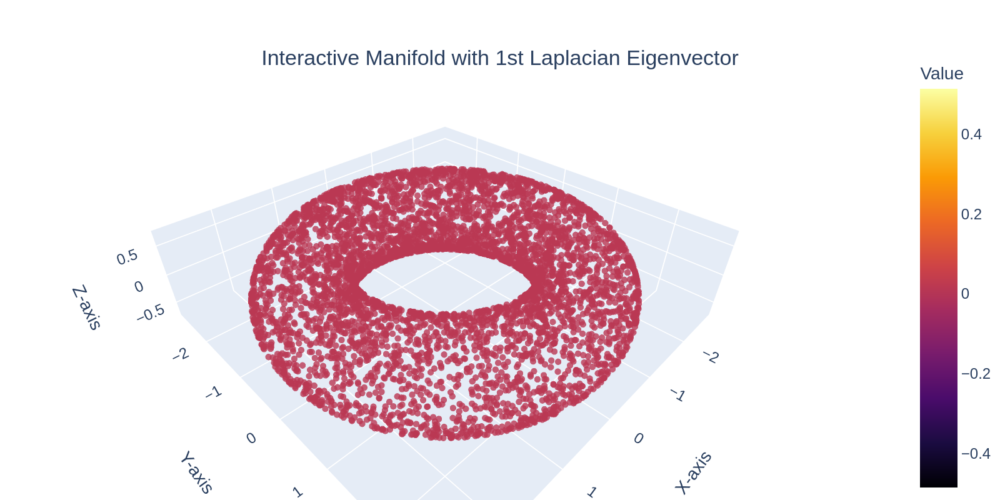

In [28]:
plot_interactive(points,eigenvectors[:,0], "Interactive Manifold with 1st Laplacian Eigenvector")

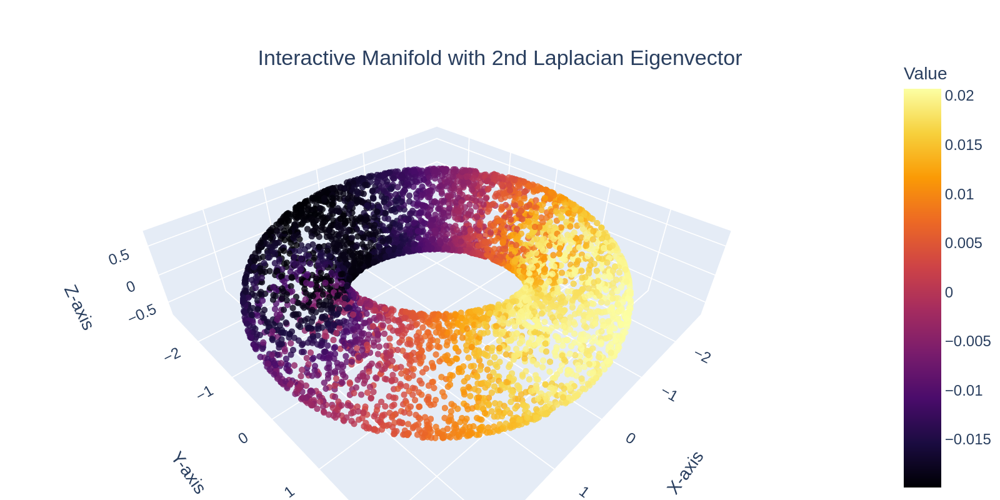

In [29]:
plot_interactive(points,eigenvectors[:,1], "Interactive Manifold with 2nd Laplacian Eigenvector")

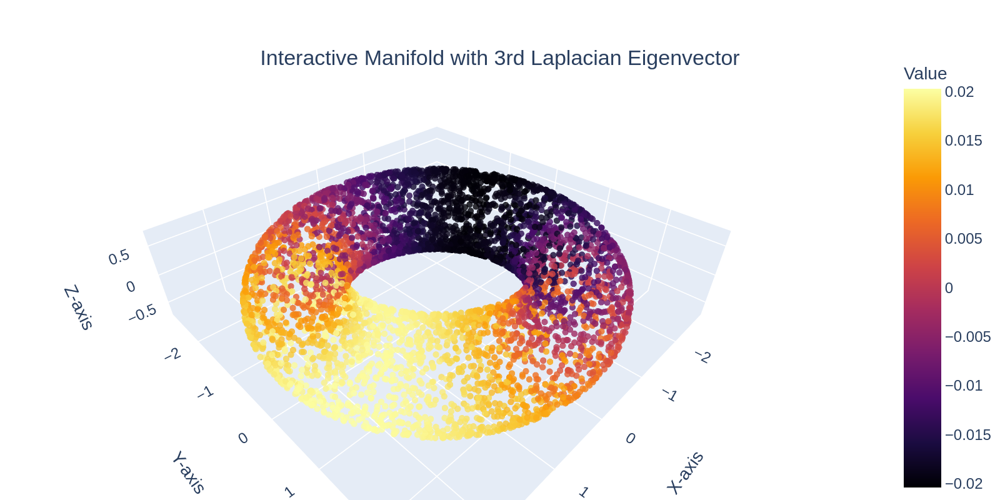

In [30]:
plot_interactive(points,eigenvectors[:,2], "Interactive Manifold with 3rd Laplacian Eigenvector")

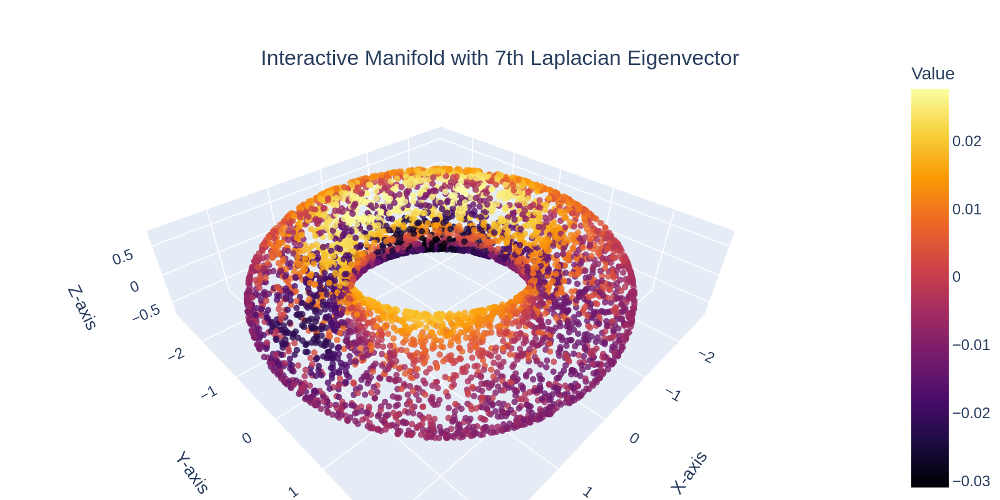

In [31]:
plot_interactive(points,eigenvectors[:,6], "Interactive Manifold with 7th Laplacian Eigenvector") # play with colors - should look constant (showing numerical errors)

##<img width="48" height="48" src="https://img.icons8.com/color/48/object.png" alt="object" style="display:inline"/> Build Manifold - Möbius Strip


In [32]:
def create_mobius_strip(width=0.2, n_samples_theta=100, n_samples_phi=30):
    theta = np.linspace(0, 2 * np.pi, n_samples_theta)
    phi = np.linspace(-width, width, n_samples_phi)
    theta, phi = np.meshgrid(theta, phi)

    x = (1 + phi/2 * np.cos(theta/2)) * np.cos(theta)
    y = (1 + phi/2 * np.cos(theta/2)) * np.sin(theta)
    z = phi/2 * np.sin(theta/2)

    return np.column_stack((x.ravel(), y.ravel(), z.ravel()))

points = create_mobius_strip()

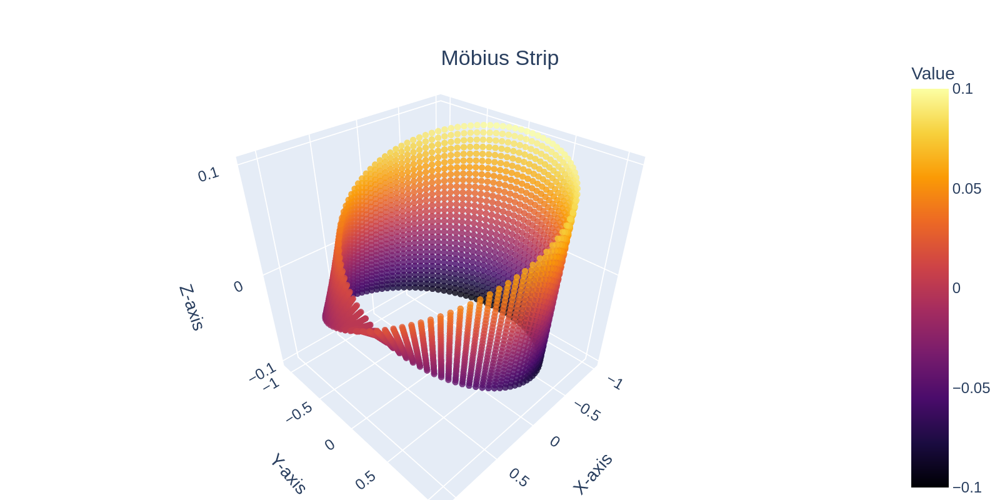

In [33]:
plot_interactive(points,points[:,2],"Möbius Strip")

## <img width="48" height="48" src="https://img.icons8.com/color-glass/48/decentralized-network.png" alt="decentralized-network" style="display:inline"/> Build K-NN Graph

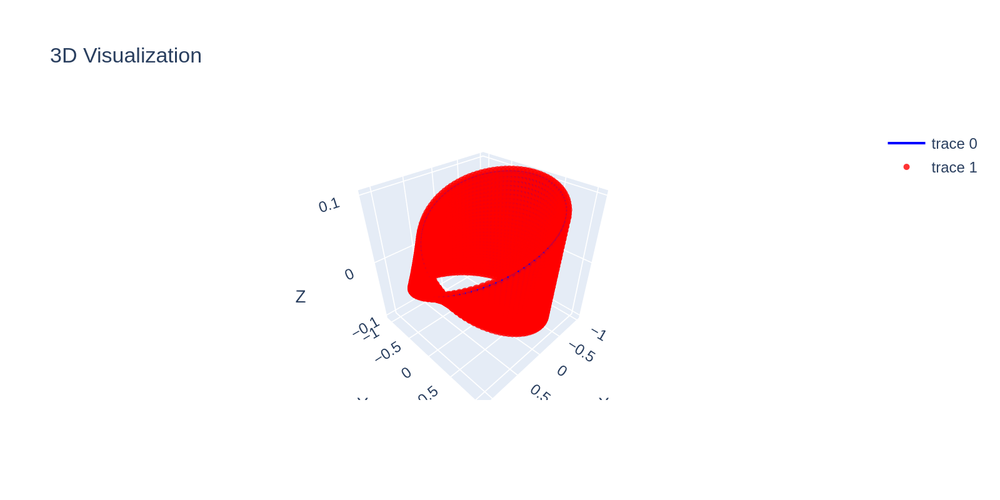

In [34]:
# Create a k-nearest neighbors graph from the points
A = kneighbors_graph(points, n_neighbors=30, mode='distance', include_self=True)
G = nx.from_scipy_sparse_array(A)
plot3d_graph_plotly(points, G)

### <img width="48" height="48" src="https://img.icons8.com/stickers/100/matrix-desktop.png" alt="matrix-desktop" style="display:inline"/> Calculate Graph Laplacian $L$

In [35]:
laplacian = nx.laplacian_matrix(G).toarray()
print(laplacian.shape)

(3000, 3000)


## <img width="48" height="48" src="https://img.icons8.com/nolan/64/audio-wave.png" alt="audio-wave" style="display:inline"/> Extract Eigenfuctions - Fourier Basis

In [36]:
eigenvalues, eigenvectors = np.linalg.eigh(laplacian)

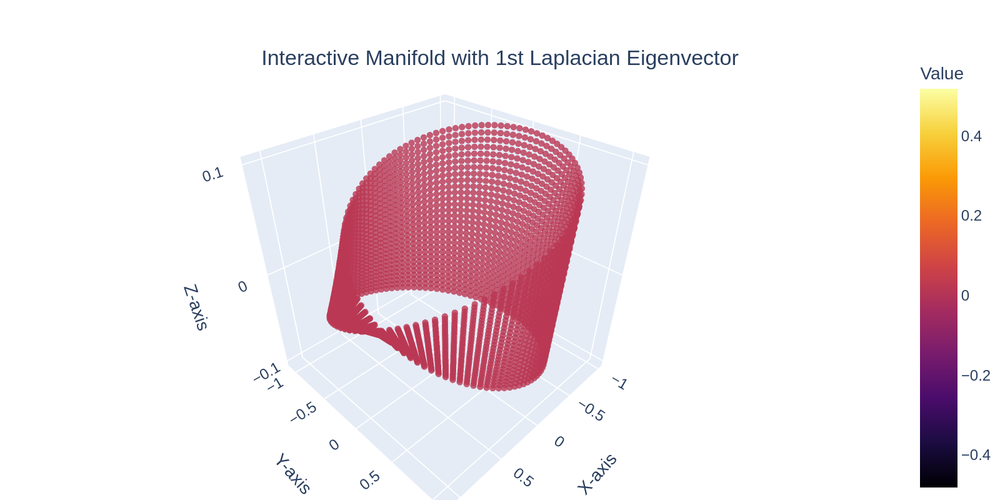

In [37]:
plot_interactive(points,eigenvectors[:,0], "Interactive Manifold with 1st Laplacian Eigenvector")

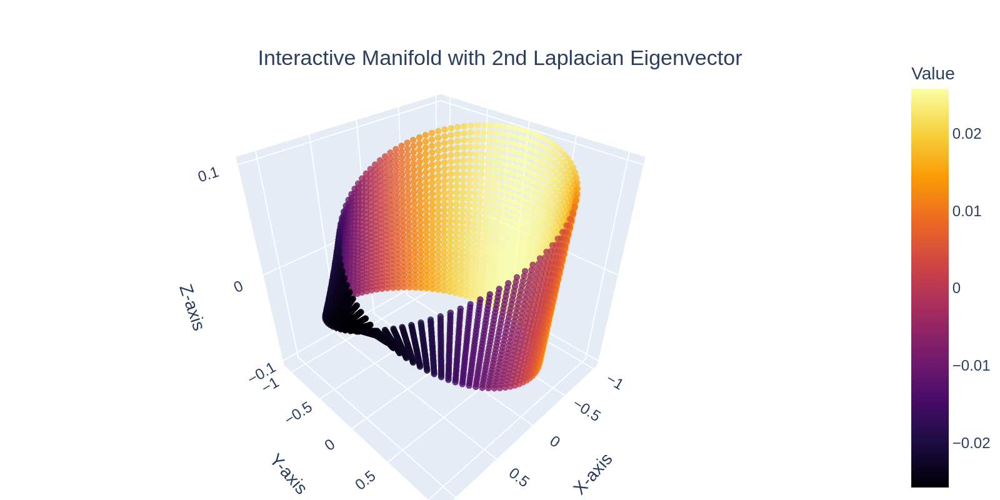

In [38]:
plot_interactive(points,eigenvectors[:,1], "Interactive Manifold with 2nd Laplacian Eigenvector")

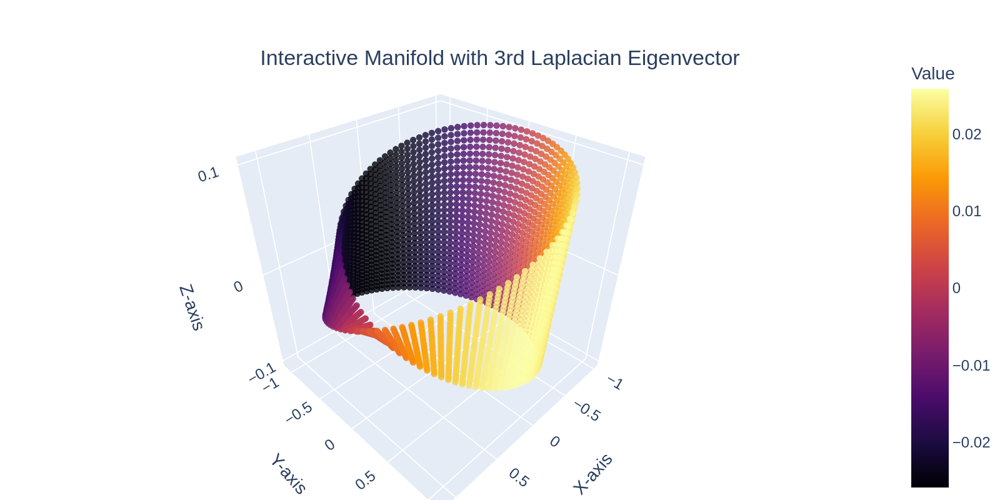

In [39]:
plot_interactive(points,eigenvectors[:,2], "Interactive Manifold with 3rd Laplacian Eigenvector")

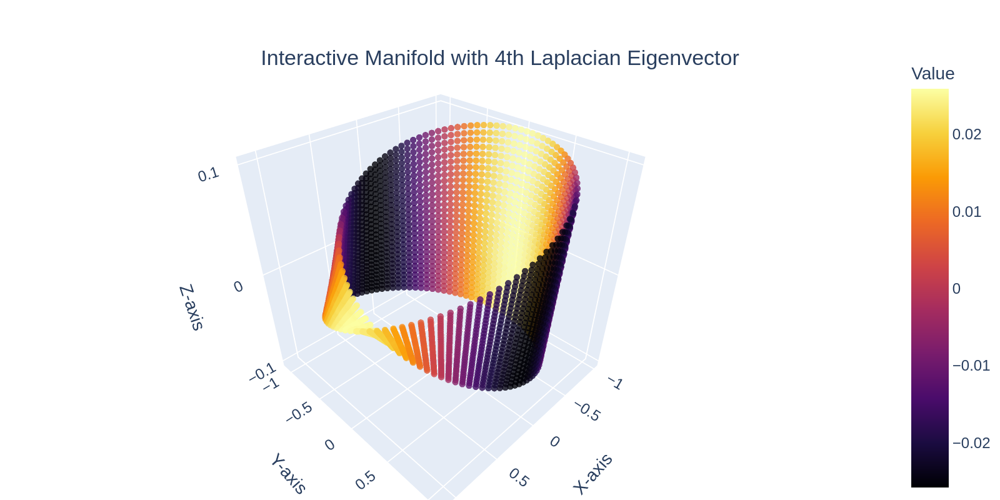

In [40]:
plot_interactive(points,eigenvectors[:,3], "Interactive Manifold with 4th Laplacian Eigenvector")

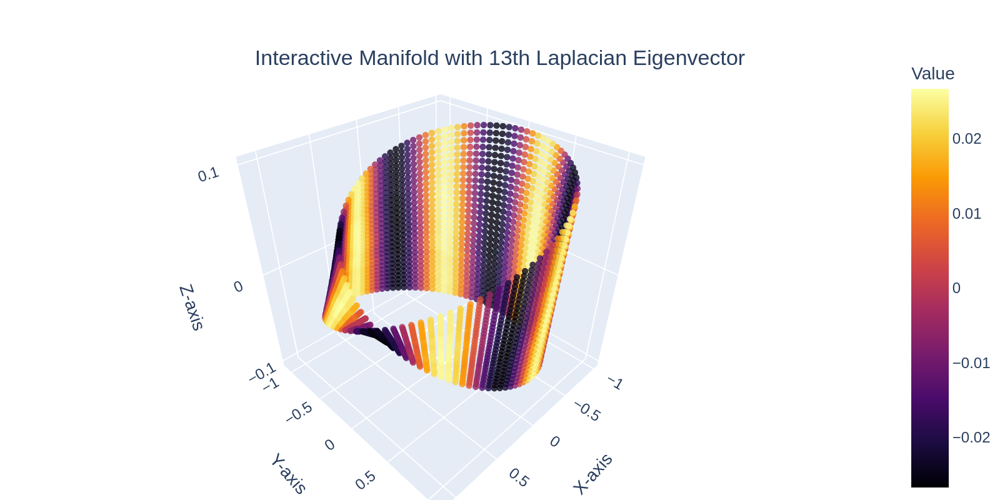

In [41]:
plot_interactive(points,eigenvectors[:,12], "Interactive Manifold with 13th Laplacian Eigenvector")

# Part 2 - Applying Graph Filters for Denoising

In [42]:
def sinc(x):
  f = np.sin(x)/x
  f[x == 0] = 1
  return f

def signal_func(points):
  sig = sinc(points[:,0]*10)*sinc(points[:,2]*60)
  # sig[points[:,0] >= 0] = 0
  # sig[points[:,1] <= 0] = 0
  return sig

<ipython-input-42-cbcb12c6cc72>:2: RuntimeWarning:

invalid value encountered in divide



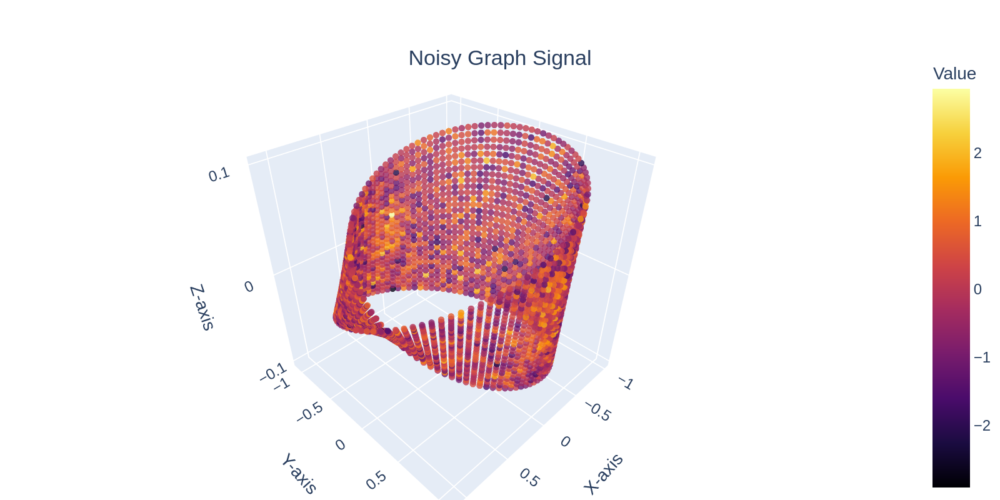

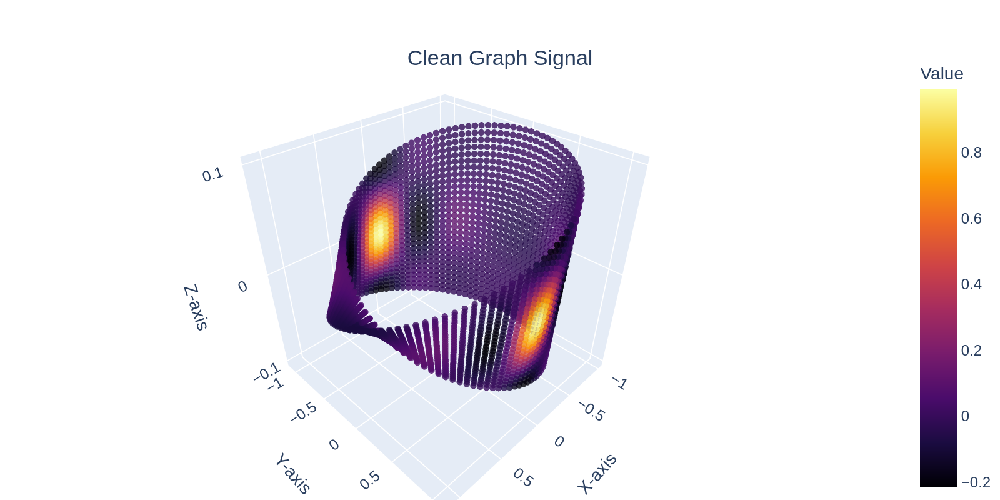

In [43]:
## Build signal

graph_signal_clean =  signal_func(points)
graph_signal = graph_signal_clean + np.random.normal(loc=0, scale=0.7,size=eigenvectors[:,12].shape)
plot_interactive(points,graph_signal, f"Noisy Graph Signal")
plot_interactive(points,graph_signal_clean, "Clean Graph Signal")

## Naive Filter Design
Choose filter $f(\lambda)$ in the frequency domain and apply it using GFT.

$$\tilde{x} = x*g=\mathcal{F}^{-1}\{X^F\bullet G^F\}$$

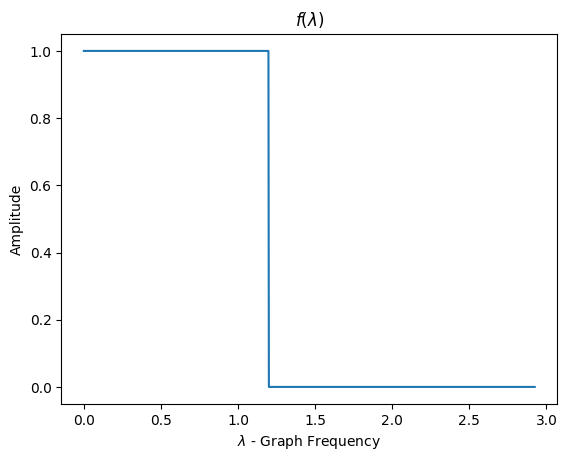

In [44]:
# define filter frequency response
def f_bpf(l,lambda_min=0,lambda_max=1.2):
  f = np.ones(l.shape)
  f[l > lambda_max] = 0
  f[l < lambda_min] = 0
  return f

# plot frequecny response
N = 1000
freq_vec = np.linspace(eigenvalues[0],eigenvalues[-1],N)
fil = f_bpf(freq_vec);
fig,ax = plt.subplots(1,1)
ax.plot(freq_vec,fil)
ax.set_xlabel(r"$\lambda$ - Graph Frequency")
ax.set_ylabel('Amplitude')
ax.set_title(r"$f(\lambda)$");



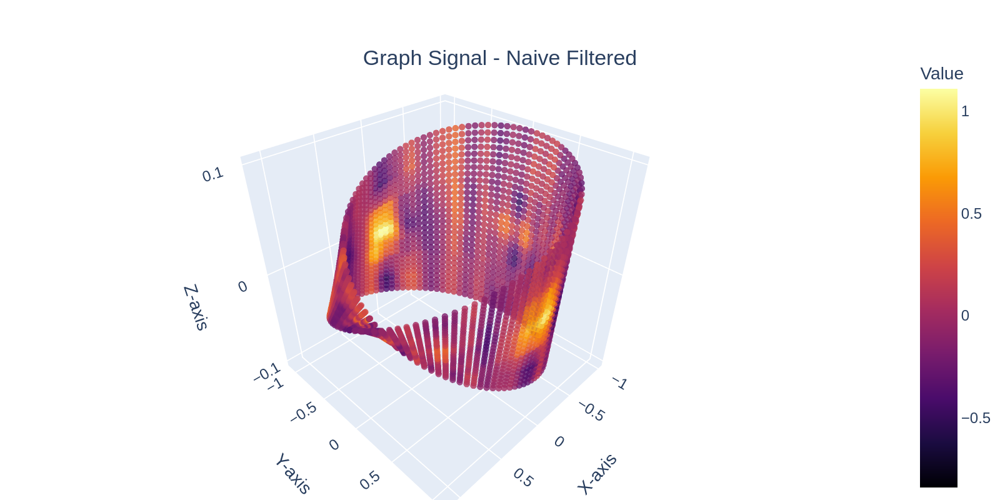

In [45]:
# Apply Filter

graph_signal_f = eigenvectors.T@graph_signal # GFT
signal_filtered_f = graph_signal_f*f_bpf(eigenvalues) # apply filter
signal_filtered = eigenvectors@signal_filtered_f # inverse GFT
# plot signal
plot_interactive(points,signal_filtered, f"Graph Signal - Naive Filtered")

## Smooth Spectral Multipliers
Smoothen the frequency response to encorage locality.


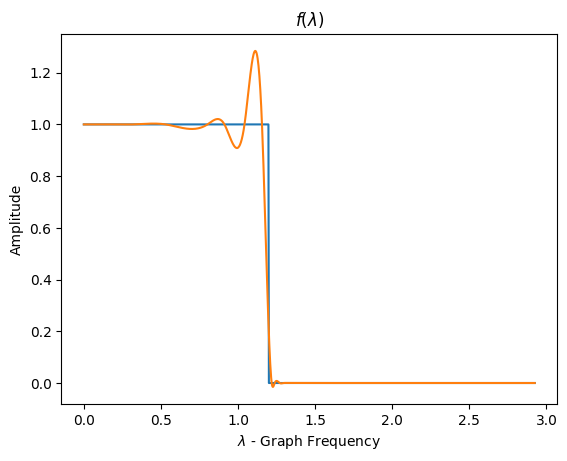

In [46]:
from scipy.interpolate import CubicSpline

# smoothen frequency response with cubic interpolation
hop = 20
f_pre_interp = f_bpf(eigenvalues[0::hop])
f_interp = CubicSpline(eigenvalues[0::hop],f_pre_interp, bc_type='natural')

freq_vec = np.linspace(eigenvalues[0],eigenvalues[-1],N)
fil = f_bpf(freq_vec);
fig,ax = plt.subplots(1,1)
ax.plot(freq_vec,fil, label = 'original')
ax.plot(freq_vec,f_interp(freq_vec),label = 'interpolated')
ax.set_xlabel(r"$\lambda$ - Graph Frequency")
ax.set_ylabel('Amplitude')
ax.set_title(r"$f(\lambda)$");

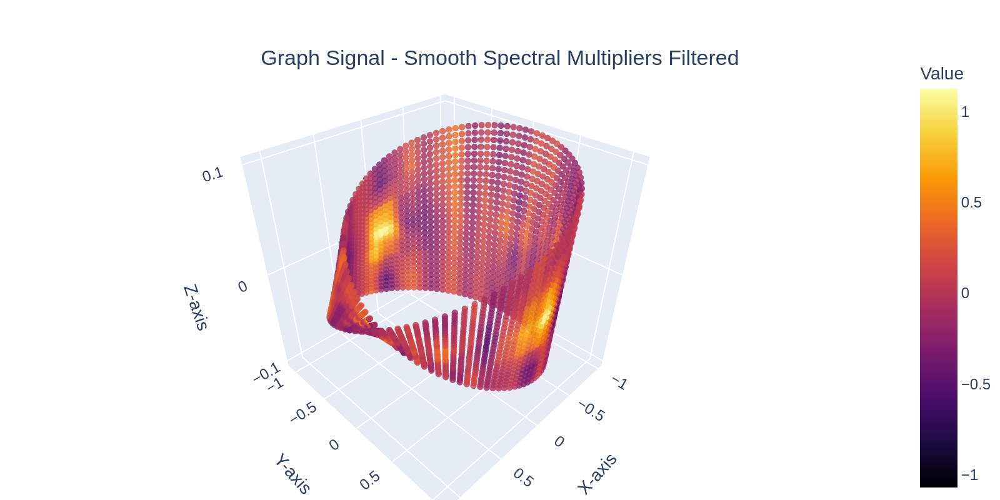

In [47]:
# Apply Filter

signal_filtered_f = graph_signal_f*f_interp(eigenvalues) # apply filter
signal_filtered = eigenvectors@signal_filtered_f # inverse GFT

# plot signal
plot_interactive(points,signal_filtered, f"Graph Signal - Smooth Spectral Multipliers Filtered")

## Polynomial Filter

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3553: RankWarning:

Polyfit may be poorly conditioned



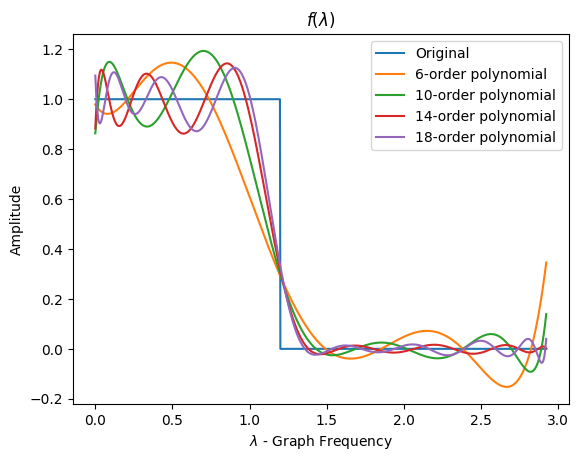

In [48]:
# fit polynomial filter to match the naive intension
fig,ax = plt.subplots(1,1)
ax.plot(freq_vec,fil, label = 'Original')
ax.set_xlabel(r"$\lambda$ - Graph Frequency")
ax.set_ylabel('Amplitude')

ax.set_title(r"$f(\lambda)$");
p_order = np.arange(6,22,4)
for p in p_order:
  p_coeffs = np.polyfit(eigenvalues, f_bpf(eigenvalues), p)
  mymodel = np.poly1d(p_coeffs)
  ax.plot(freq_vec,mymodel(freq_vec), label = f'{p}-order polynomial')


ax.legend()

In [49]:
def graph_poly_filt(L,signal,p_coeffs):
  # initalize filtered signal
  signal_filt = np.zeros(signal.shape)
  Lx_prev = signal
  # polynom coeffs order is from p[0]x^deg to p[deg]x^0
  for p in np.flip(p_coeffs):
    signal_filt += p*Lx_prev
    # calculate L^i*x for the next iteration
    Lx_prev = L@Lx_prev

  return signal_filt


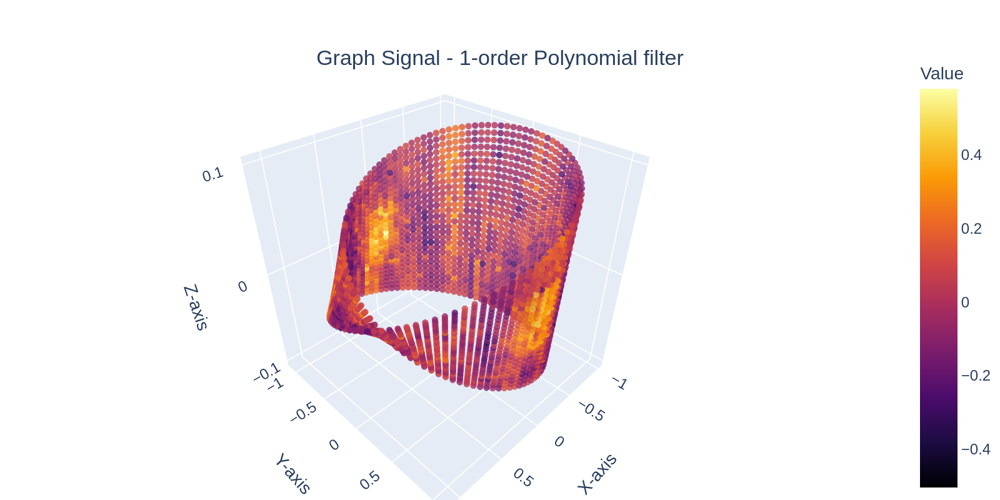

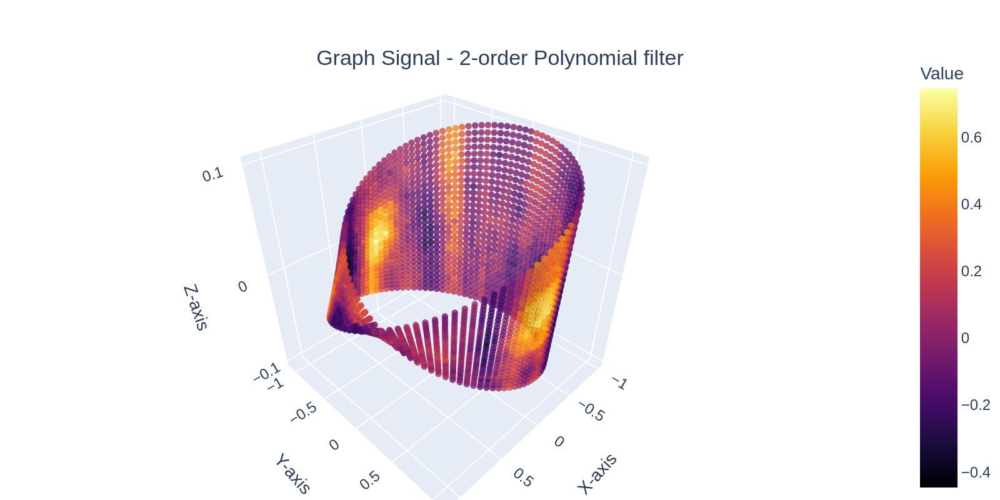

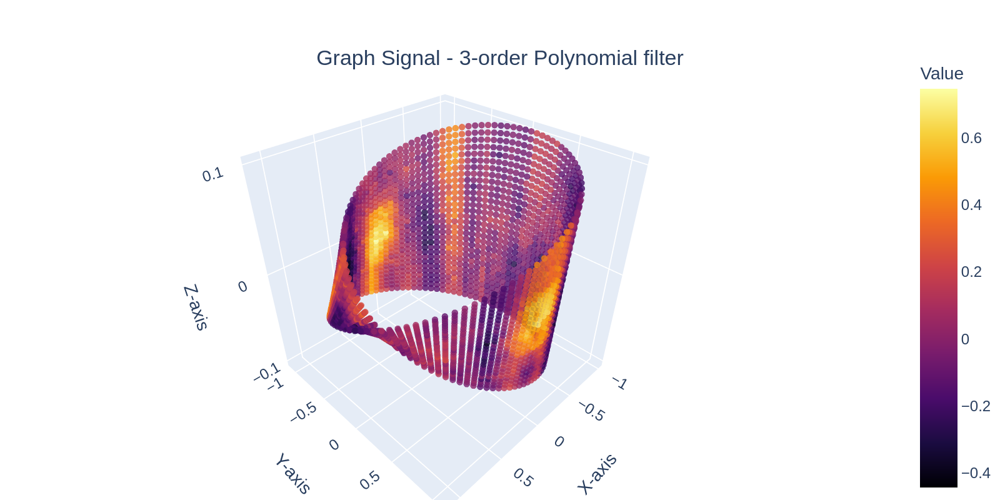

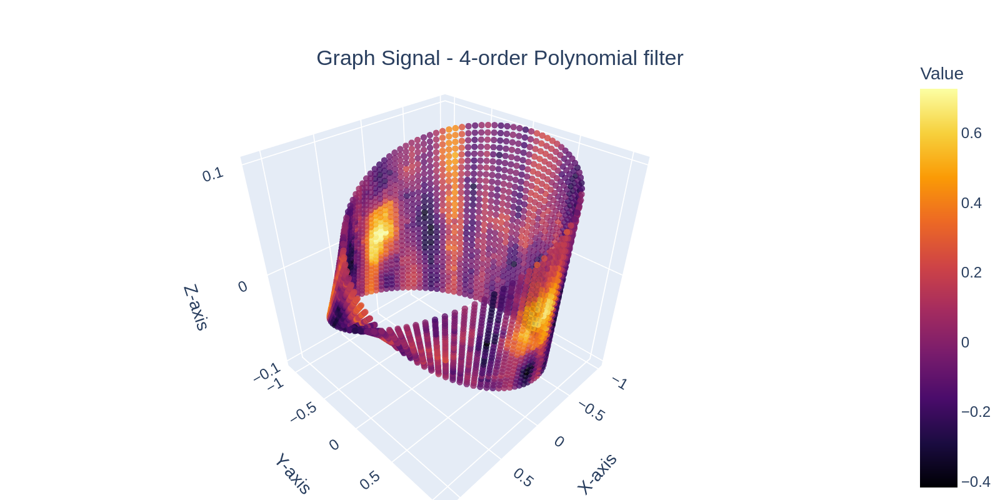

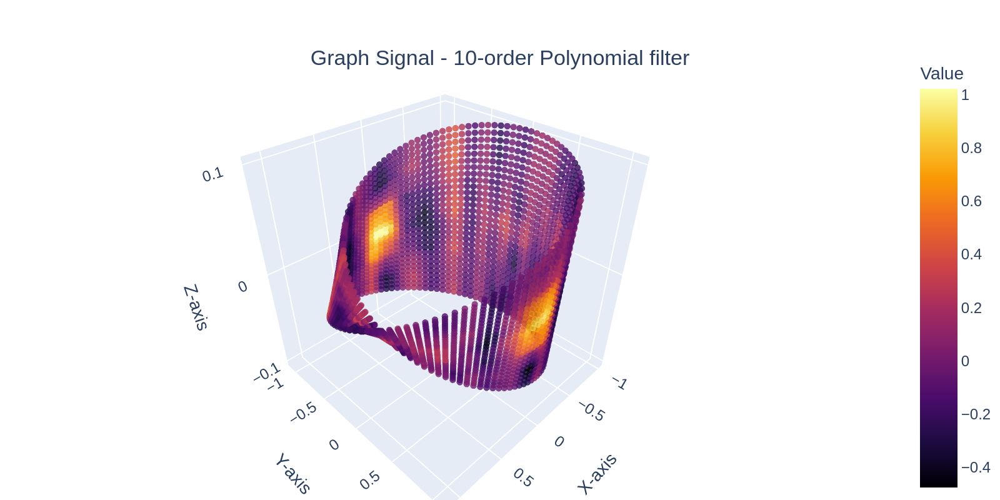

In [50]:
# Apply Filter
p_order = np.append(np.arange(1,5),10)
for p in p_order:
  p_coeffs = np.polyfit(eigenvalues, f_bpf(eigenvalues), p)
  signal_filtered = graph_poly_filt(laplacian,graph_signal,p_coeffs)
  poly_model = np.poly1d(p_coeffs)
  # plot signal
  plot_interactive(points,signal_filtered, f"Graph Signal - {p}-order Polynomial filter")

## Part 3 - Implementing Spectral GNNs
### Cora Dataset
- Citation Network

Number of graphs: 1,
Number of features: 1433 (bag of words),
Number of classes: 7


Number of nodes: 2708,
Number of edges: 10556,
Average node degree: 3.90,


Number of training nodes: 140,
Training node label rate: 0.05
Has isolated nodes: False
Has self-loops: False
Is undirected: True

- The task is node classification, 5% of the nodes are labeled and we wish to label the rest.

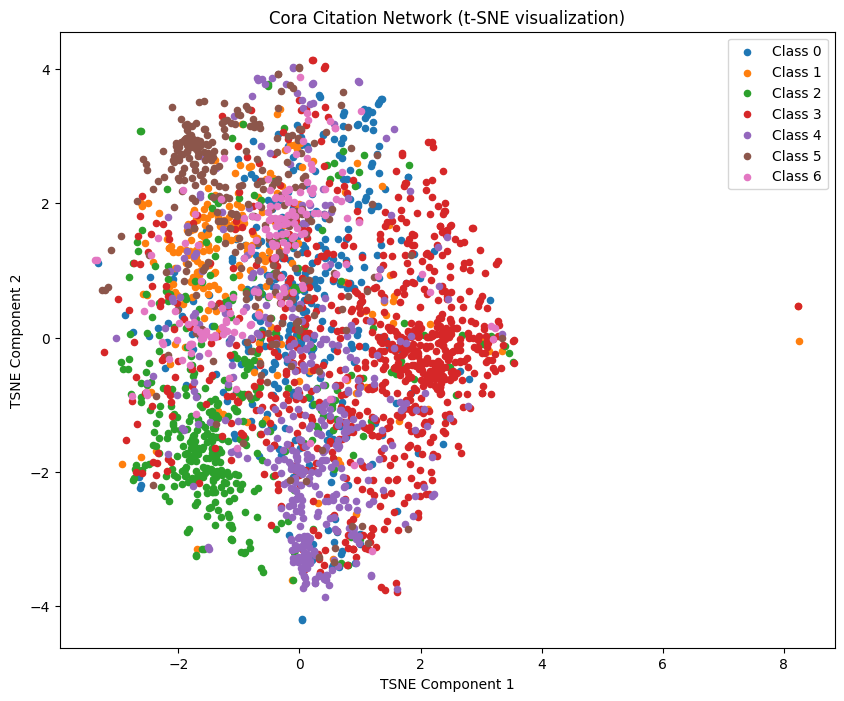

In [51]:
# Dimensionality reduction with t-SNE
tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
x_tsne = tsne.fit_transform(data.x.detach().numpy())

# Get the edge index in COO format
edge_index = data.edge_index.numpy()

# Plot
plt.figure(figsize=(10, 8))
for i in range(dataset.num_classes):
    idx = data.y == i
    plt.scatter(x_tsne[idx, 0], x_tsne[idx, 1], label=f'Class {i}', s=20)  # s is the size of the point

# Optionally, you can plot a subset of edges if needed
if edge_index.shape[1] < 1000:  # Plot edges for smaller graphs
    for i in range(edge_index.shape[1]):
        source = edge_index[0, i]
        target = edge_index[1, i]
        plt.plot(x_tsne[[source, target], 0], x_tsne[[source, target], 1], c='black', alpha=0.5)

plt.xlabel('TSNE Component 1')
plt.ylabel('TSNE Component 2')
plt.title('Cora Citation Network (t-SNE visualization)')
plt.legend()
plt.show()

### Spectral GNN Layer
We define a Spectral GNN layer that operates in the spectral domain.(maybe)

In [52]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SpectralGNNLayer(nn.Module):
    def __init__(self, eigenvectors, d_cutoff, in_channels, out_channels):
        super(SpectralGNNLayer, self).__init__()
        self.d_cutoff = d_cutoff
        self.in_channels = in_channels
        self.out_channels = out_channels

        self.eigenvectors = torch.tensor(eigenvectors[:, :d_cutoff], dtype=torch.float32) # Shape: [N, D]
        self.theta = nn.Parameter(torch.randn(d_cutoff, in_channels, out_channels)) # Shape: [D, F_in, F_out]
        nn.init.xavier_uniform_(self.theta)

    def forward(self, x):
        # Fourier transform
        x_spectral = self.eigenvectors.T @ x # Shape: [D, N] @ [N, F_in] -> [D, F_in]

        # Introduce a singleton dimension for input channels
        x_spectral = x_spectral.unsqueeze(-1)  # Shape: [D, F_in, 1]

        # Apply spectral filters
        x_spectral = torch.mul(x_spectral, self.theta) # Shape: [D, F_in, F_out]

        #sum over input channels
        filtered = torch.sum(x_spectral,dim=1)  # Shape: [D, F_out]

        x_transformed = self.eigenvectors @ filtered # Shape: [N, Fout]
        return x_transformed

class TwoLayerSpectralGNN(nn.Module):
    def __init__(self, eigenvectors, d_cutoff, num_features, num_hidden_features, num_output_classes):
        super(TwoLayerSpectralGNN, self).__init__()
        # Initialize both layers with the eigenvectors
        self.layer1 = SpectralGNNLayer(eigenvectors, d_cutoff, num_features, num_hidden_features)
        self.layer2 = SpectralGNNLayer(eigenvectors, d_cutoff, num_hidden_features, num_output_classes)

    def forward(self, x):
        # First layer with ReLU activation
        x = self.layer1(x)
        x = F.relu(x)

        # Second layer
        x = self.layer2(x)
        return x

In [53]:
from torch_geometric.utils import to_scipy_sparse_matrix, add_self_loops


# Add self-loops to the adjacency matrix
edge_index, _ = add_self_loops(data.edge_index, num_nodes=data.num_nodes)

# Compute the adjacency matrix as a sparse matrix
adjacency_matrix = to_scipy_sparse_matrix(edge_index)

# Compute the degree matrix
degrees = adjacency_matrix.sum(axis=0).A1  # Sum of each row
D = torch.diag(torch.pow(torch.tensor(degrees, dtype=torch.float32), -0.5))

# Convert the adjacency matrix to a torch tensor
A = torch.tensor(adjacency_matrix.todense(), dtype=torch.float32)

# Compute the normalized Laplacian
I = torch.eye(data.num_nodes)  # Identity matrix
L = I - torch.matmul(torch.matmul(D, A), D)
cora_eigenvalues, cora_eigenvectors = np.linalg.eigh(L)

In [54]:
model = TwoLayerSpectralGNN(cora_eigenvectors, d_cutoff = 100, num_features=data.x.shape[1], num_hidden_features=16, num_output_classes=7)
print("num of parameters is ", count_parameters(model))
print("1433*16*5 + 16*7*5")


optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
criterion = torch.nn.CrossEntropyLoss()

def train():
      model.train()
      optimizer.zero_grad()  # Clear gradients.
      out = model(data.x)  # Perform a single forward pass.
      loss = criterion(out[data.train_mask], data.y[data.train_mask])  # Compute the loss solely based on the training nodes.
      loss.backward()  # Derive gradients.
      optimizer.step()  # Update parameters based on gradients.
      return loss

def test():
      model.eval()
      out = model(data.x)
      pred = out.argmax(dim=1)  # Use the class with highest probability.
      test_correct = pred[data.test_mask] == data.y[data.test_mask]  # Check against ground-truth labels.
      test_acc = int(test_correct.sum()) / int(data.test_mask.sum())  # Derive ratio of correct predictions.
      return test_acc

test_acc = test()
print(f'Accuracy before training: {test_acc:.4f}')

for epoch in range(1, 101):
    loss = train()
    print(f'Epoch: {epoch:03d}, Loss: {loss:.4f}')

num of parameters is  2304000
1433*16*5 + 16*7*5
Accuracy before training: 0.1690
Epoch: 001, Loss: 1.9459
Epoch: 002, Loss: 1.9437
Epoch: 003, Loss: 1.9391
Epoch: 004, Loss: 1.9321
Epoch: 005, Loss: 1.9223
Epoch: 006, Loss: 1.9096
Epoch: 007, Loss: 1.8941
Epoch: 008, Loss: 1.8757
Epoch: 009, Loss: 1.8547
Epoch: 010, Loss: 1.8314
Epoch: 011, Loss: 1.8062
Epoch: 012, Loss: 1.7793
Epoch: 013, Loss: 1.7511
Epoch: 014, Loss: 1.7215
Epoch: 015, Loss: 1.6909
Epoch: 016, Loss: 1.6594
Epoch: 017, Loss: 1.6269
Epoch: 018, Loss: 1.5935
Epoch: 019, Loss: 1.5592
Epoch: 020, Loss: 1.5240
Epoch: 021, Loss: 1.4881
Epoch: 022, Loss: 1.4518
Epoch: 023, Loss: 1.4152
Epoch: 024, Loss: 1.3786
Epoch: 025, Loss: 1.3419
Epoch: 026, Loss: 1.3054
Epoch: 027, Loss: 1.2690
Epoch: 028, Loss: 1.2328
Epoch: 029, Loss: 1.1968
Epoch: 030, Loss: 1.1613
Epoch: 031, Loss: 1.1264
Epoch: 032, Loss: 1.0925
Epoch: 033, Loss: 1.0596
Epoch: 034, Loss: 1.0278
Epoch: 035, Loss: 0.9974
Epoch: 036, Loss: 0.9684
Epoch: 037, Loss: 

Accuracy after training: 0.6850


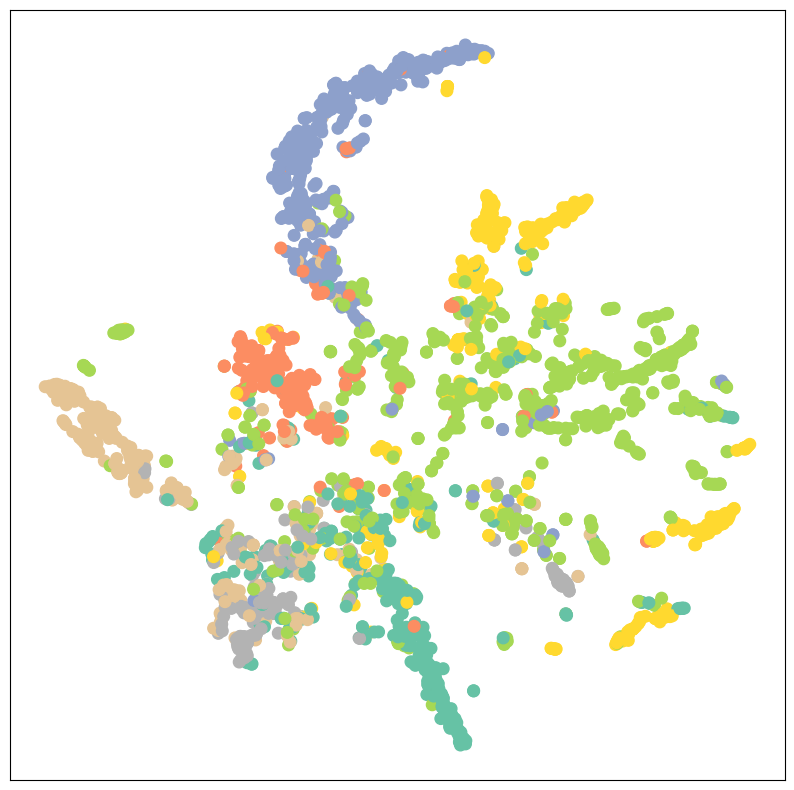

In [55]:
test_acc = test()
print(f'Accuracy after training: {test_acc:.4f}')

model.eval()
out = model(data.x)
visualize(out, color=data.y)

###Building a Model and Training
We'll build a simple model and prepare for training.

## Using ChebConv


In [56]:
from torch_geometric.nn import ChebConv
import torch
import torch.nn as nn
import torch.nn.functional as F

class ChebNet(nn.Module):
    def __init__(self, num_features, num_hidden_features ,num_output_classes, K=2):
        super(ChebNet, self).__init__()
        # K defines the order of the Chebyshev polynomials
        self.conv1 = ChebConv(num_features, num_hidden_features, K=K)
        self.conv2 = ChebConv(num_hidden_features, num_output_classes, K=K)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index

        x = F.relu(self.conv1(x, edge_index))
        x = F.dropout(x, training=self.training)
        x = self.conv2(x, edge_index)

        return x

In [57]:
model = ChebNet(num_features=data.num_features, num_hidden_features=16 ,num_output_classes=7, K=3)

print("num of parameters is ", count_parameters(model))
print("K * (num_features * num_hidden_features ) + num_hidden_features(bias) + K * (num_hidden_features * num_output_classes ) + num_output_classes(bias)")
print("2 * (1433 * 16 ) + 16 + 2 * (16 * 7 ) + 7")
optimizer = torch.optim.Adam(model.parameters(), lr=0.1, weight_decay=5e-4)
criterion = torch.nn.CrossEntropyLoss()

def train():
      model.train()
      optimizer.zero_grad()  # Clear gradients.
      out = model(data)  # Perform a single forward pass.
      loss = criterion(out[data.train_mask], data.y[data.train_mask])  # Compute the loss solely based on the training nodes.
      loss.backward()  # Derive gradients.
      optimizer.step()  # Update parameters based on gradients.
      return loss

def test():
      model.eval()
      out = model(data)
      pred = out.argmax(dim=1)  # Use the class with highest probability.
      test_correct = pred[data.test_mask] == data.y[data.test_mask]  # Check against ground-truth labels.
      test_acc = int(test_correct.sum()) / int(data.test_mask.sum())  # Derive ratio of correct predictions.
      return test_acc

test_acc = test()
print(f'Accuracy before training: {test_acc:.4f}')

# Training loop (no changes needed here)
for epoch in range(1, 101):
    loss = train()
    print(f'Epoch: {epoch:03d}, Loss: {loss:.4f}')

num of parameters is  69143
K * (num_features * num_hidden_features ) + num_hidden_features(bias) + K * (num_hidden_features * num_output_classes ) + num_output_classes(bias)
2 * (1433 * 16 ) + 16 + 2 * (16 * 7 ) + 7
Accuracy before training: 0.1070
Epoch: 001, Loss: 1.9472
Epoch: 002, Loss: 1.7669
Epoch: 003, Loss: 1.5121
Epoch: 004, Loss: 1.0400
Epoch: 005, Loss: 0.7446
Epoch: 006, Loss: 0.4753
Epoch: 007, Loss: 0.3544
Epoch: 008, Loss: 0.2709
Epoch: 009, Loss: 0.2102
Epoch: 010, Loss: 0.1777
Epoch: 011, Loss: 0.1164
Epoch: 012, Loss: 0.1208
Epoch: 013, Loss: 0.1203
Epoch: 014, Loss: 0.1178
Epoch: 015, Loss: 0.1245
Epoch: 016, Loss: 0.1761
Epoch: 017, Loss: 0.1132
Epoch: 018, Loss: 0.1269
Epoch: 019, Loss: 0.1309
Epoch: 020, Loss: 0.1318
Epoch: 021, Loss: 0.1090
Epoch: 022, Loss: 0.1243
Epoch: 023, Loss: 0.1207
Epoch: 024, Loss: 0.1364
Epoch: 025, Loss: 0.1017
Epoch: 026, Loss: 0.1025
Epoch: 027, Loss: 0.0941
Epoch: 028, Loss: 0.1132
Epoch: 029, Loss: 0.0687
Epoch: 030, Loss: 0.0704


Accuracy before training: 0.8110


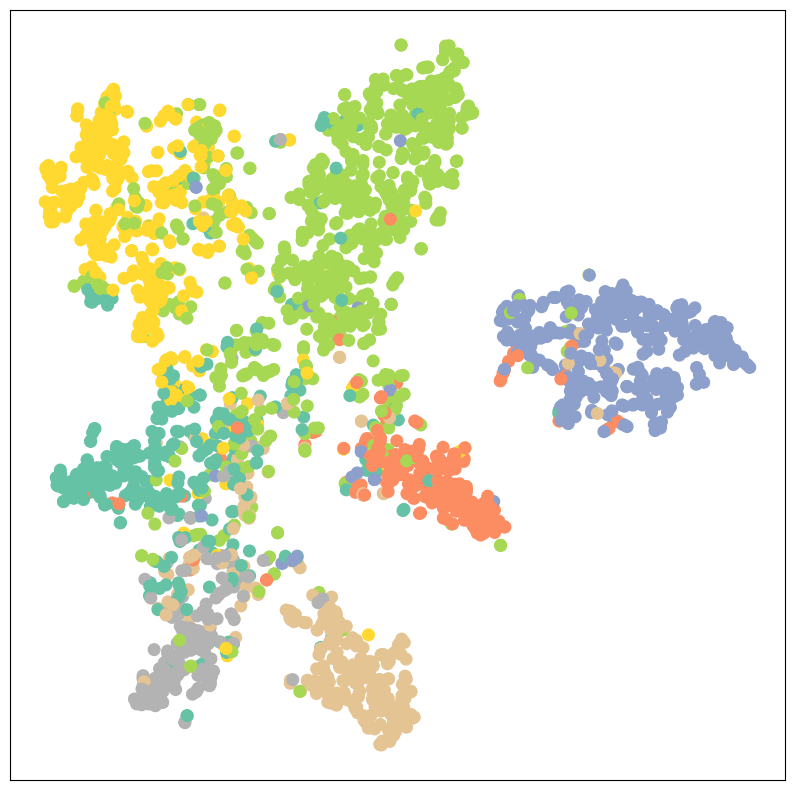

In [58]:
test_acc = test()
print(f'Accuracy before training: {test_acc:.4f}')

model.eval()
out = model(data)
visualize(out, color=data.y)

checking new way to SpectralGNN

## GCN

In [59]:
from torch_geometric.nn import GCNConv

class GCN(nn.Module):
    def __init__(self, num_features, num_hidden_features ,num_output_classes):
        super().__init__()
        # K defines the order of the Chebyshev polynomials
        self.conv1 = GCNConv(num_features, num_hidden_features)
        self.conv2 = GCNConv(num_hidden_features, num_output_classes)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index

        x = F.relu(self.conv1(x, edge_index))
        x = F.dropout(x, training=self.training)
        x = self.conv2(x, edge_index)

        return x

In [60]:
model = GCN(num_features=data.num_features, num_hidden_features=16 ,num_output_classes=7)

print("num of parameters is ", count_parameters(model))
print("K * (num_features * num_hidden_features ) + num_hidden_features(bias) + K * (num_hidden_features * num_output_classes ) + num_output_classes(bias)")
print("1 * (1433 * 16 ) + 16 + 2 * (16 * 7 ) + 7")
optimizer = torch.optim.Adam(model.parameters(), lr=0.1, weight_decay=5e-4)
criterion = torch.nn.CrossEntropyLoss()

def train():
      model.train()
      optimizer.zero_grad()  # Clear gradients.
      out = model(data)  # Perform a single forward pass.
      loss = criterion(out[data.train_mask], data.y[data.train_mask])  # Compute the loss solely based on the training nodes.
      loss.backward()  # Derive gradients.
      optimizer.step()  # Update parameters based on gradients.
      return loss

def test():
      model.eval()
      out = model(data)
      pred = out.argmax(dim=1)  # Use the class with highest probability.
      test_correct = pred[data.test_mask] == data.y[data.test_mask]  # Check against ground-truth labels.
      test_acc = int(test_correct.sum()) / int(data.test_mask.sum())  # Derive ratio of correct predictions.
      return test_acc

test_acc = test()
print(f'Accuracy before training: {test_acc:.4f}')

# Training loop (no changes needed here)
for epoch in range(1, 101):
    loss = train()
    print(f'Epoch: {epoch:03d}, Loss: {loss:.4f}')

num of parameters is  23063
K * (num_features * num_hidden_features ) + num_hidden_features(bias) + K * (num_hidden_features * num_output_classes ) + num_output_classes(bias)
1 * (1433 * 16 ) + 16 + 2 * (16 * 7 ) + 7
Accuracy before training: 0.1740
Epoch: 001, Loss: 1.9461
Epoch: 002, Loss: 1.9285
Epoch: 003, Loss: 1.8893
Epoch: 004, Loss: 1.8335
Epoch: 005, Loss: 1.7839
Epoch: 006, Loss: 1.6736
Epoch: 007, Loss: 1.6047
Epoch: 008, Loss: 1.5213
Epoch: 009, Loss: 1.4257
Epoch: 010, Loss: 1.3381
Epoch: 011, Loss: 1.1995
Epoch: 012, Loss: 1.1453
Epoch: 013, Loss: 1.0280
Epoch: 014, Loss: 0.9573
Epoch: 015, Loss: 0.9076
Epoch: 016, Loss: 0.7607
Epoch: 017, Loss: 0.7629
Epoch: 018, Loss: 0.7182
Epoch: 019, Loss: 0.6652
Epoch: 020, Loss: 0.6357
Epoch: 021, Loss: 0.5838
Epoch: 022, Loss: 0.5251
Epoch: 023, Loss: 0.5152
Epoch: 024, Loss: 0.5067
Epoch: 025, Loss: 0.5517
Epoch: 026, Loss: 0.4870
Epoch: 027, Loss: 0.4549
Epoch: 028, Loss: 0.4687
Epoch: 029, Loss: 0.4346
Epoch: 030, Loss: 0.4454


Accuracy after training: 0.7770


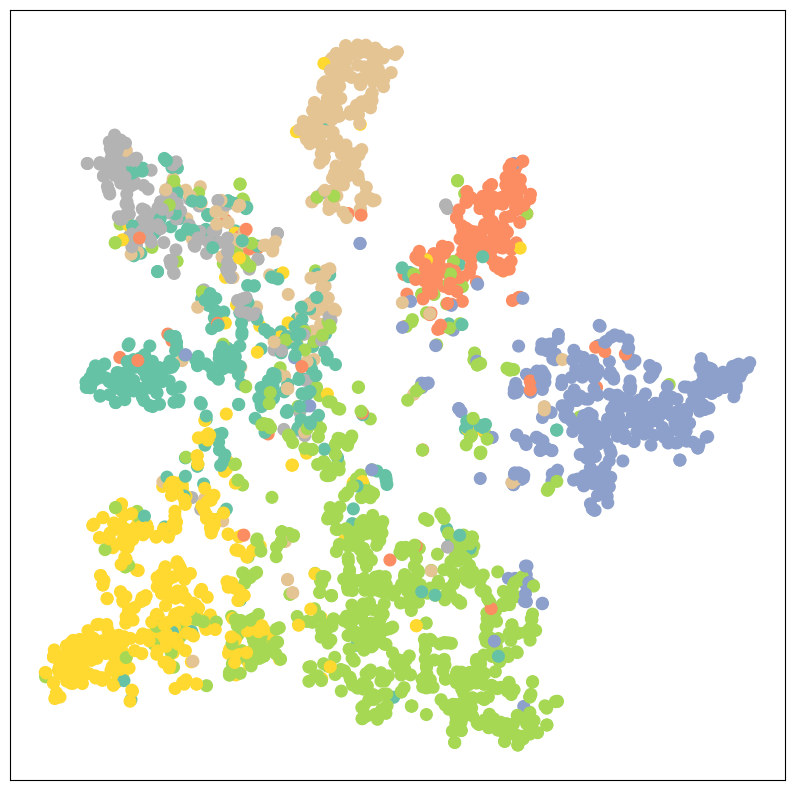

In [61]:
test_acc = test()
print(f'Accuracy after training: {test_acc:.4f}')

model.eval()
out = model(data)
visualize(out, color=data.y)